<a href="https://colab.research.google.com/github/VuongDS/ImageClassification/blob/main/IClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook, we will try the process of implementing CNN with Keras in order to classify images.

I.   **Firstly**, we'll import useful packages.

II.   **Then**, we'll load the data, before visualize and preprocess it.

III.  **We'll try a simple CNN model** and then we will evaluate its performances.

IV.   **Finally,** we'll use techniques such as data augmentation, learning rate decay and dropout to increase our test F1.

# I. Let import all useful packages.

In [ ]:
# install package
!pip install tensorflow-addons

# import package
from tensorflow import keras
import tensorflow.keras.layers as Layers
import tensorflow.keras.activations as Actications
import tensorflow.keras.models as Models
import tensorflow.keras.optimizers as Optimizer
import tensorflow.keras.metrics as Metrics
import tensorflow.keras.utils as Utils
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import TensorBoard,ModelCheckpoint,ReduceLROnPlateau
from tensorflow.keras.initializers import Constant,RandomNormal
import tensorflow_addons as tfa
import os
import random
import datetime
import cv2
import numpy as np
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix as CM
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plot
import seaborn as sn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 14.6 MB/s 


**Task 1:** Setting Fre GPU in this Google Colab notebook.

[*Hint.*](https://medium.com/deep-learning-turkey/google-colab-free-gpu-tutorial-e113627b9f5d)

In [ ]:
import tensorflow
tensorflow.test.gpu_device_name()

'/device:GPU:0'

## Mounting Google Drive locally
**Task 2:** Mount the Google Driver into the Google Colab Driver.

[*Hint.*](https://colab.research.google.com/notebooks/io.ipynb#scrollTo=eikfzi8ZT_rW)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


**Task 3**: Copy the zip dataset from Google Drive into Colab, then unzip it and finally remove the zip file to free up space.

[*Hint.*](https://medium.com/datadriveninvestor/speed-up-your-image-training-on-google-colab-dc95ea1491cf)

In [ ]:
from pathlib import Path
base = Path('/content/gdrive/MyDrive')
link = base/'image-classification.zip'
# copy
!cp "{link}" .
# unzip quiet
!unzip -q image-classification.zip
# remove zip file
!rm image-classification.zip
# show file name
!ls

gdrive	sample_data  seg_pred  seg_test  seg_train


# II. Load the data.

## About dataset.
This is image data of Natural Scenes around the world.
This Data contains around 25k images of size 150x150 distributed under 6 categories. {'buildings' -> 0, 'forest' -> 1, 'glacier' -> 2, 'mountain' -> 3, 'sea' -> 4, 'street' -> 5 }

The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test.


Now, We need to prepare our data to feed into the model. There is a builtin method in Keras that can extract your images from folder.

Following is the gernalized functions used to extract data from the directory.

In [ ]:
# Here's our 6 categories that we have to classify.
class_names = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
class_names_label = {'buildings': 0,
                    'forest' : 1,
                    'glacier' : 2,
                    'mountain' : 3,
                    'sea' : 4,
                    'street' : 5
                    }
nb_classes = 6

## Loading the Data

**Task 4:** We have to write a load_data function that load the training and test data ( which contain images and the labels) from the folder.

* **Load_data** function return **train_set** and **test_set**. Each set contains **images and labels**.
* Apply 2 augmentation transformations (**shear_range** = 0.2, **zoom_range** = 0.2), shuffle with seed = 8 and rescaling function( to [0, 1]) to **train_set.**
* Apply rescaling funtion to [0, 1]  to **test_set**, no shuffle.
* Batch size = 32.



[*Hint.*](https://keras.io/preprocessing/image/)


In [ ]:
import tensorflow as tf

In [ ]:
# Task 4: We have to write a load_data function that load the training and 
# test data ( which contain images and the labels) from the folder.
def load_data(data_directories):
    """
        Load the data:
            - 14,034 images to train the network.
            - 3000 images to evaluate how accurately the network learned to classify images.
        Input:
            Data directory.
        Return: 
            training_set, testing_set.
    """
    ## TYPE YOUR CODE for task 4 here:
    train = ImageDataGenerator(shear_range=0.2, zoom_range=0.2,rescale = 1./255)
    test = ImageDataGenerator(rescale = 1./255)
    training_set = train.flow_from_directory(data_directories[0],target_size = (150,150),seed = 8,shuffle = True, batch_size = 32)
    testing_set = test.flow_from_directory(data_directories[1],target_size = (150,150), shuffle = False, batch_size = 32)
    return training_set, testing_set


data_directories = ['/content/seg_train/seg_train', '/content/seg_test/seg_test']
train_dataset, test_dataset = load_data(data_directories)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


## Let's explore the dataset.
We can, for example, ask ourselves:

* How many training and testing examples do we have ?
* What is the size of the images ?
* What is the proportion of each observed category ?

As you see, The Training data is in shape of (Number of Training Images, Width of image, Height of image, Channel of image). This shape is very important. If you didnot resize the images to same size. It should be (No. of images,) shape. So, using this shape you cant feed the images to the model.


**Task 5:** Print out:

*  Number of training examples.
*  Number of testing examples.
* Size of each image.



In [ ]:
# Task 5: Print out:

# Number of training examples.
# Number of testing examples.
# Size of each image.

print('Number of training examples:',train_dataset.samples)
print('Number of testing examples:',test_dataset.samples)
print('Size of each image:',train_dataset.image_shape)

Number of training examples: 14034
Number of testing examples: 3000
Size of each image: (150, 150, 3)


**Task 6:** Plot a pie chart of the proportion of each class.
You need to show the name and proportion of each class on the pie chart.

*Hint:* [plot.pie](https://matplotlib.org/3.1.1/gallery/pie_and_polar_charts/pie_features.html#sphx-glr-gallery-pie-and-polar-charts-pie-features-py)

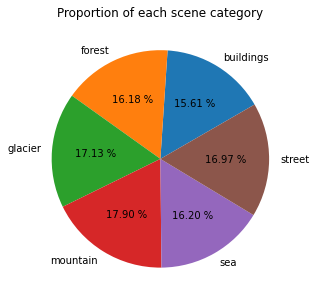

In [ ]:
def plot_pie(train_dataset, class_names):
    ## TYPE YOUR CODE for task 6 here:
    import pandas as pd
    labels = pd.Series(train_dataset.labels)
    labels = labels.value_counts(sort = False)
    plot.figure(figsize = (9,5))
    plot.pie(labels,labels=class_names,autopct='%.2f %%',startangle=30)
    plot.title('Proportion of each scene category')
    plot.show()

plot_pie(train_dataset, class_names)

**Task 7**: Display the 36 random images from the training set.

* Each class contain 6 random images.
* Bellow the image, show the class it belongs to.

*Hint*: [plot.imshow](https://matplotlib.org/3.1.0/gallery/images_contours_and_fields/image_demo.html)

In [ ]:
training_set_local = tf.keras.preprocessing.image_dataset_from_directory(
  'seg_train/seg_train/',
  labels="inferred",
  label_mode="int",
  class_names=class_names,
  color_mode="rgb",
  batch_size=None,
  image_size=(256, 256),
  shuffle=True,
  seed=8)

Found 14034 files belonging to 6 classes.


In [ ]:
# function to get 6 imges for each class
def class_im(numb_class):
    dataset_class = training_set_local.filter(lambda img, label: label == numb_class)
    dataset_class = dataset_class.batch(6)
    return dataset_class

In [ ]:
# function to concat all class after get 6 images
def concat_class():
  ds_plt = class_im(0).take(1).concatenate(class_im(1).take(1)).concatenate(class_im(2).take(1)).concatenate(class_im(3).take(1)).concatenate(class_im(4).take(1)).concatenate(class_im(5).take(1))
  ds_plt = ds_plt.unbatch()
  ds_plt = ds_plt.batch(36)
  return ds_plt

In [ ]:
import matplotlib.pyplot as plt

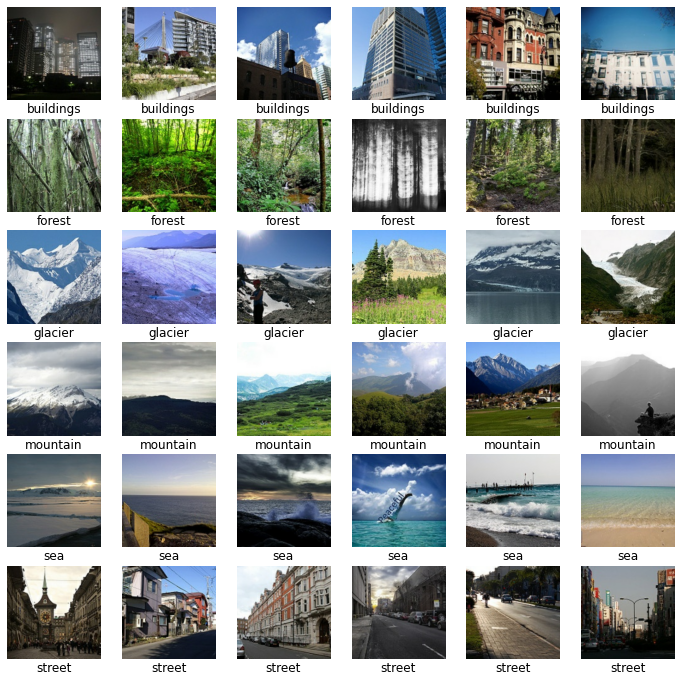

In [ ]:
def visualize_image():
    ## TYPE YOUR CODE for task 7 here:
    ds_plt = concat_class()
    plt.figure(figsize=(12, 12))
    for images,labels in ds_plt:
        for i in range(36):
            ax = plt.subplot(6, 6, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(class_names[labels[i]], y=-0.2)
            plt.axis("off")
        plot.show()

visualize_image()

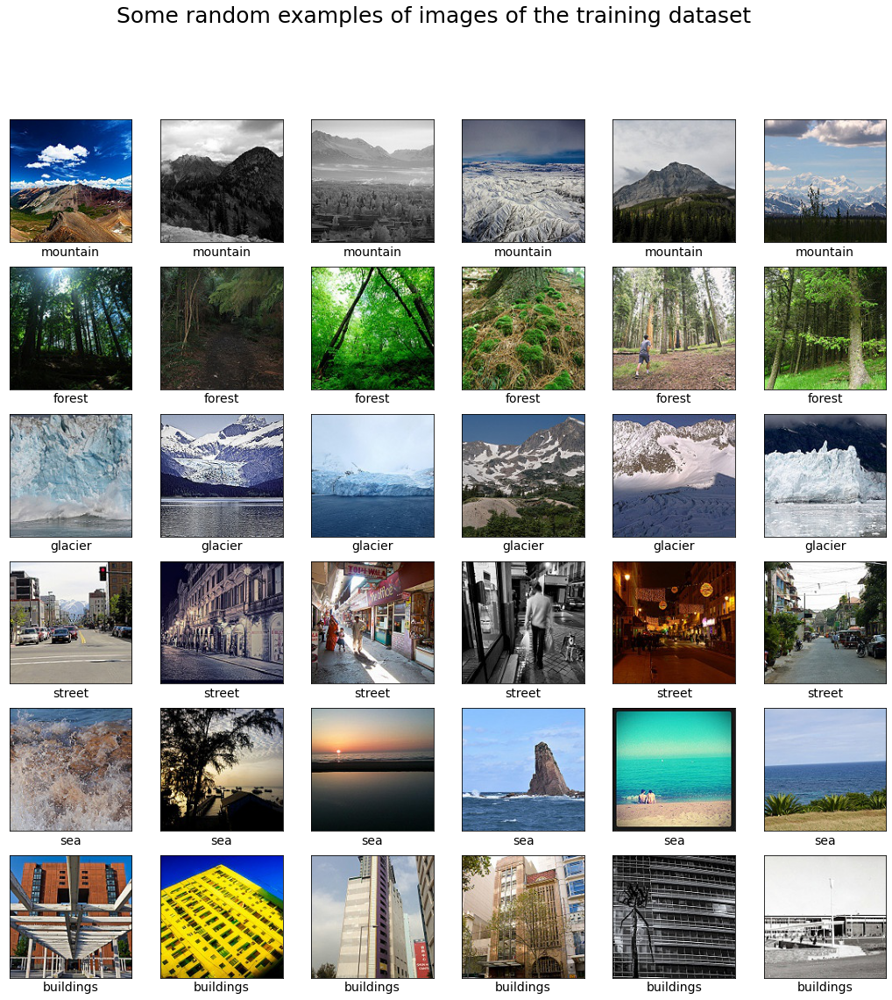

In [ ]:
# Task 7: Display the 36 random images from the training set.

# Each class contain 6 random images.
# Bellow the image, show the class it belongs to.
def visualize_image(train_directory):
    ## TYPE YOUR CODE for task 7 here:
    classes = os.listdir('seg_train/seg_train/')
    plot.figure(figsize = (18,18))
    for i,clas in enumerate(classes):
      for j in range(6):
        plot.subplot(6,6,i*6+j+1)
        picture_name = np.random.choice(os.listdir(f'{train_directory}{clas}'))
        picture_array = plot.imread(f'{train_directory}{clas}/{picture_name}')
        plot.imshow(picture_array)
        plot.xticks([])
        plot.yticks([])
        plot.xlabel(clas,fontsize = 14)
    plot.suptitle('Some random examples of images of the training dataset',fontsize = 25)
    plot.show()

train_directory = 'seg_train/seg_train/'
visualize_image(train_directory)

# III. Modelling
## There are some steps we need to finish:
* Build the model.

* Compile the model.

* Train / fit the data to the model.

* Evaluate the model on the testing set.


## Build the model
We can build an easy model composed of different layers such as:

* [Conv2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D).

* [MaxPooling2D:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D) The images get smaller sized.

* [Flatten:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Flatten) Transforms the format of the images from a 2d-array to a 1d-array of 150 150 3 pixel values.

* [Relu:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/ReLU) given a value x, returns max(x, 0).

* [Softmax:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Softmax) 6 neurons, probability that the image belongs to one of the classes.

* [Dense.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense)

* [Dropout.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout)

**Task 8**: Buil a model, which contain these layers:
- Layer 1: Conv2D, 8 filters, kernel_size = (3, 3), activation = 'relu', input_shape = image_shape, same padding.
- Layer 2: Conv2D, 16 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 3: MaxPooling2D, pooling size = (2, 2).
- Layer 4: Conv2D, 32 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 5: Conv2D, 64 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 6: MaxPooling2D, pooling size = (3, 3).
- Layer 7: Conv2D, 128 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 8: Conv2D, 256 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 9: MaxPooling2D, pooling size = (5, 5).
- Layer 10: Flatten.
- Layer 11: Dense with number of unit = 100, activation = 'relu'.
- Layer 12: Dropout with probs = 0.5.
- Layer 13: Final dense with number of unit = number of class, activation = 'softmax'.



All the Conv2D and Dense layers are followed by a Batch Norm layer with customized configuration excepts from the last dense layer:

- momentum=0.95 
- epsilon=0.005
- beta_initializer = RandomNormal with mean = 0 and stddev = 0.05
- gammaa_initializer = Constant with value = 0.9


In [ ]:
# Task 8: Buil a model, which contain these layers:
def create_model():
    '''
    Return: 
        CNN model with 13 layers.
    '''
    
    model = Models.Sequential([
        Layers.Conv2D(8,(3,3),padding = 'same',activation = 'relu', input_shape = train_dataset.image_shape,name = 'Layer1'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.Conv2D(16,(3,3),padding = 'same',activation = 'relu',name = 'Layer2'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.MaxPooling2D((2,2),name = 'Layer3'),

        Layers.Conv2D(32,(3,3),padding = 'same',activation = 'relu',name = 'Layer4'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.Conv2D(64,(3,3),padding = 'same',activation = 'relu',name ='Layer5'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.MaxPooling2D((3,3),name = 'Layer6'),

        Layers.Conv2D(128,(3,3),padding = 'same',activation = 'relu',name = 'Layer7'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.Conv2D(256,(3,3),padding = 'same',activation = 'relu',name = 'Layer8'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.MaxPooling2D((5,5),name = 'Layer9'),

        Layers.Flatten(name = 'Layer10'),
        Layers.Dense(100,'relu',name = 'Layer11'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.Dropout(rate = 0.5,name = 'Layer12'),

        Layers.Dense(nb_classes,'softmax',name = 'Layer13')
    ])
    ## TYPE YOUR CODE for task 8 here:

    return model
model = create_model()

**Task 9:** Compile the model. Then print out the model summary.
* [Compile](https://keras.io/models/model/#compile) the model with Adam Optimizaer, lr = 1e-4, categorical-crossentroy loss and "[F1 score](https://github.com/tensorflow/addons/issues/825)" as metric.
* Print out the model F1.

In [ ]:
def optimize(model):
    '''
    Input: 
        Model.
    Return: 
        Complied model.
    '''
    ## TYPE YOUR CODE for task 9 here:
    model.compile(Optimizer.Adam(learning_rate=1e-4),'CategoricalCrossentropy',
                  metrics = [tfa.metrics.FBetaScore(average='macro',num_classes=6,beta=1.,threshold = 0.5)])
    return model

model = optimize(model)
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Layer1 (Conv2D)             (None, 150, 150, 8)       224       
                                                                 
 batch_normalization (BatchN  (None, 150, 150, 8)      32        
 ormalization)                                                   
                                                                 
 Layer2 (Conv2D)             (None, 150, 150, 16)      1168      
                                                                 
 batch_normalization_1 (Batc  (None, 150, 150, 16)     64        
 hNormalization)                                                 
                                                                 
 Layer3 (MaxPooling2D)       (None, 75, 75, 16)        0         
                                                                 
 Layer4 (Conv2D)             (None, 75, 75, 32)        4

**Task 10**: Setup callback.
* Create the [tensorboard callback](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to save the logs.
* Create the [checkpoint callback](https://machinelearningmastery.com/check-point-deep-learning-models-keras/) to save the checkpoint with the best F1 after each epoch. 
* Create the [ReduceLROnPlateau callback](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ReduceLROnPlateau) to reduce learning rate when the validation F1 score has stopped improving with the factor of 0.1 and patience = 2.

In [ ]:
# Task 10: Setup callback.
def callback_model(checkpoint_name, logs_name):
    '''
    Input: 
        Best checkpoint name, logs name.
    Return: 
        Callback list, which contains tensorboard callback and checkpoint callback.
    '''
    ## TYPE YOUR CODE for task 10 here:
    logdir = os.path.join(logs_name, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    # logdir = logs_name
    tensorboard = TensorBoard( log_dir=logdir,histogram_freq=1)
    checkpoint = ModelCheckpoint(f'/content/gdrive/My Drive/{checkpoint_name}',monitor='val_fbeta_score', save_best_only=True, mode='max', save_freq='epoch',verbose=1)
    reduce_lr = ReduceLROnPlateau(monitor='val_fbeta_score', factor=0.1, patience=2, verbose=0, mode='auto', min_delta=0.0001)
    callbacks_list = [tensorboard,checkpoint,reduce_lr]
    return callbacks_list

checkpoint_name = 'weights.best.hdf5'
logs_name = 'training_logs'
callbacks_list = callback_model(checkpoint_name, logs_name)

**Task 11:** Train the model.

**Requirement:** 
* Train the model with 10 epochs, generator = train_dataset, validataion_data = test_dataset.
* Return the model with best-checkpoint weights.

*Hint:*
[Fit](https://keras.io/models/sequential/#fit_generator) the model first, then reload the model ([load_model function](https://keras.io/getting-started/faq/)) with best-checkpoint weights.

In [ ]:
# Task 11: Train the model.
def train_model(model, callbacks_list):
    '''
    Input: 
        Model and callback list,
    Return: 
        Model with best-checkpoint weights.
    '''
    ## TYPE YOUR CODE for task 11 here:
    model.fit(train_dataset,epochs=10,validation_data = test_dataset,callbacks = callbacks_list)
    return model
model = train_model(model, callbacks_list)


Epoch 1/10
439/439 [==============================] - ETA: 0s - loss: 1.0500 - fbeta_score: 0.5953
Epoch 1: val_fbeta_score improved from -inf to 0.71996, saving model to /content/gdrive/My Drive/weights.best.hdf5
439/439 [==============================] - 108s 217ms/step - loss: 1.0500 - fbeta_score: 0.5953 - val_loss: 0.7682 - val_fbeta_score: 0.7200 - lr: 1.0000e-04
Epoch 2/10
439/439 [==============================] - ETA: 0s - loss: 0.7596 - fbeta_score: 0.7117
Epoch 2: val_fbeta_score improved from 0.71996 to 0.76964, saving model to /content/gdrive/My Drive/weights.best.hdf5
439/439 [==============================] - 90s 204ms/step - loss: 0.7596 - fbeta_score: 0.7117 - val_loss: 0.6501 - val_fbeta_score: 0.7696 - lr: 1.0000e-04
Epoch 3/10
439/439 [==============================] - ETA: 0s - loss: 0.6520 - fbeta_score: 0.7597
Epoch 3: val_fbeta_score improved from 0.76964 to 0.80364, saving model to /content/gdrive/My Drive/weights.best.hdf5
439/439 [============================

b **Task 12**: [Show the tensorboard](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) in the notebook.

In [ ]:
## TYPE YOUR CODE for task 12 here:
#!kill 685
# Task 12: Show the tensorboard in the notebook.
%load_ext tensorboard
%tensorboard --logdir 'training_logs'


<IPython.core.display.Javascript object>

**Task 13:** Prediction on test set.
* Complete the get_prediction_classes function.
* Print out the test F1. 

In [ ]:
# Task 13: Prediction on test set.
def get_prediction_classes(model, prediction_dataset):
    ## TYPE YOUR CODE for task 13 here:
    '''
    Input: 
        Model and prediction dataset.
    Return: 
        Prediction list and groundtrurth list with predicted classes.
    '''
    preds = model.predict(prediction_dataset)
    import numpy as np
    preds = np.argmax(preds,axis = 1)
    groundtruth = prediction_dataset.labels
    return preds,groundtruth

In [ ]:
best_model = Models.load_model('/content/gdrive/My Drive/weights.best.hdf5') 
loss, f1_score = best_model.evaluate(test_dataset)
print('Test F1:',f1_score)

94/94 [==============================] - 4s 42ms/step - loss: 0.5128 - fbeta_score: 0.8220
Test F1: 0.8219966888427734


In [ ]:
test_predictions, test_groundtruths = get_prediction_classes(best_model, test_dataset)

In [ ]:
def get_prediction_classes(model, prediction_dataset):
    ## TYPE YOUR CODE for task 13 here:
    '''
    Input: 
        Model and prediction dataset.
    Return: 
        Prediction list and groundtrurth list with predicted classes.
    '''
    

**Task 14:** Perform the predicted result on test set using confusion matrix.
Remember to show the class name in the confusion matrix. 

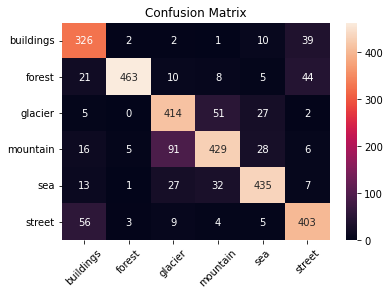

In [ ]:
def plot_confusion_matrix(predictions, groundtruth, class_names):
    ## TYPE YOUR CODE for task 14 here:
    cm = CM(predictions,groundtruth)
    sn.heatmap(cm,annot=True,fmt = '.0f')
    num = len(class_names)
    plot.xticks(np.arange(num)+0.5,class_names,rotation = 45)
    plot.yticks(np.arange(num)+0.5,class_names,rotation = 0)
    plot.title('Confusion Matrix')
    plot.show()
plot_confusion_matrix(test_predictions, test_groundtruths, class_names)

**Task 15**: Model finetuning - fine tune the model using some of these approachs:
* Increase max epochs, change batch size.
* Play around with CNN, Dense and Dropoutlayers (add/# units/etc).
* Increase data augmentation transformations.
* Try to use a [pretrained model](https://www.tensorflow.org/api_docs/python/tf/keras/applications) on Keras.

Requirement: The val_best_F1 should be higher than 87%.

In [ ]:
# TYPE YOUR CODE for task 15 here:

# Increase max epochs, change batch size.
model = create_model() 
model = optimize(model)
history = model.fit(train_dataset,validation_data = test_dataset, batch_size = 64,epochs = 20,callbacks = callbacks_list,verbose = False)


Epoch 1: val_fbeta_score did not improve from 0.82200

Epoch 2: val_fbeta_score did not improve from 0.82200

Epoch 3: val_fbeta_score did not improve from 0.82200

Epoch 4: val_fbeta_score did not improve from 0.82200

Epoch 5: val_fbeta_score did not improve from 0.82200

Epoch 6: val_fbeta_score did not improve from 0.82200

Epoch 7: val_fbeta_score did not improve from 0.82200

Epoch 8: val_fbeta_score did not improve from 0.82200

Epoch 9: val_fbeta_score did not improve from 0.82200

Epoch 10: val_fbeta_score did not improve from 0.82200

Epoch 11: val_fbeta_score did not improve from 0.82200

Epoch 12: val_fbeta_score did not improve from 0.82200

Epoch 13: val_fbeta_score did not improve from 0.82200

Epoch 14: val_fbeta_score did not improve from 0.82200

Epoch 15: val_fbeta_score did not improve from 0.82200


In [ ]:
# Play around with CNN, Dense and Dropoutlayers (add/# units/etc).
def create_model2():
    '''
    Return: 
        CNN model with 13 layers.
    '''
    
    model = Models.Sequential([
        Layers.Conv2D(8,(3,3),padding = 'same',activation = 'relu', input_shape = train_dataset.image_shape,name = 'Layer1'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.Conv2D(16,(3,3),padding = 'same',activation = 'relu',name = 'Layer2'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.MaxPooling2D((2,2),name = 'Layer3'),

        Layers.Conv2D(32,(3,3),padding = 'same',activation = 'relu',name = 'Layer4'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.Conv2D(64,(3,3),padding = 'same',activation = 'relu',name ='Layer5'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.MaxPooling2D((3,3),name = 'Layer6'),

        Layers.Conv2D(128,(3,3),padding = 'same',activation = 'relu',name = 'Layer7'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.Conv2D(256,(3,3),padding = 'same',activation = 'relu',name = 'Layer8'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.MaxPooling2D((5,5),name = 'Layer9'),

        Layers.Conv2D(256,(3,3),padding = 'same',activation = 'relu',name = 'Layer71'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.Conv2D(512,(3,3),padding = 'same',activation = 'relu',name = 'Layer81'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.MaxPooling2D((5,5),name = 'Layer91'),

        Layers.Flatten(name = 'Layer10'),
        Layers.Dense(100,'relu',name = 'Layer11'),
        Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value = 0.9)),
        Layers.Dropout(rate = 0.5,name = 'Layer12'),

        Layers.Dense(nb_classes,'softmax',name = 'Layer13')
    ])
    ## TYPE YOUR CODE for task 8 here:

    return model
model2 = create_model2()
model2 = optimize(model2)
model2 = train_model(model2, callbacks_list)


In [ ]:
# Try to use a pretrained model on Keras.
from tensorflow.keras.applications import VGG19
vgg19_model = VGG19(include_top = False,input_shape=train_dataset.image_shape)
x = vgg19_model.output
x = Layers.Flatten(name = 'flatten')(x)
x = Layers.Dense(128,'relu')(x)
x = Layers.Dropout(0.5)(x)
x = Layers.BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer= RandomNormal(mean=0.0, stddev=0.05), gamma_initializer = Constant(value=0.9))(x)
x = Layers.Dense(6,'softmax')(x)

model3 = Models.Model(inputs = vgg19_model.input, outputs = x)
model3 = optimize(model3)
model3 = train_model(model3, callbacks_list)

In [ ]:
best_model = Models.load_model('/content/gdrive/My Drive/weights.best.hdf5') 
loss, f1_score = best_model.evaluate(test_dataset)
print('Test F1:',f1_score)

In [ ]:
%tensorboard --logdir 'training_logs'

In [ ]:
test_predictions, test_groundtruths = get_prediction_classes(best_model, test_dataset)
plot_confusion_matrix(test_predictions, test_groundtruths, class_names)

In [ ]:
!wget -P sea.jpg 'https://www.sailorsforthesea.org/sites/default/files/homepage_2-adj.jpg'

In [ ]:
img = Utils.load_img('/content/sea.jpg/homepage_2-adj.jpg')
img_array = np.array(img.resize((150,150)))
pred = best_model.predict(np.expand_dims(img_array,0))
pred_name = class_names[np.argmax(pred)]
plot.imshow(img_array)
plot.xticks([])
plot.yticks([])
plot.xlabel('model predict: %s (%.2f %%)'%(pred_name,pred.max()*100));